In [95]:
# https://www.kaggle.com/harlfoxem/housesalesprediction#
# House Sales Prediction

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 

import tensorflow as tf
from tensorflow import keras


In [73]:
data=pd.read_csv("../DATA/kc_house_data.csv")
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [74]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

<AxesSubplot:>

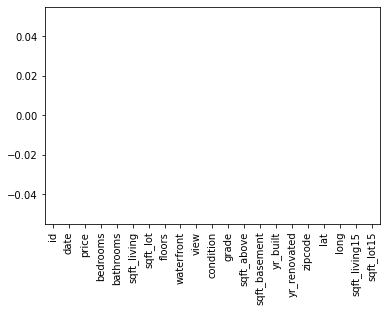

In [75]:
data.isnull().sum().plot.bar() # No null values

In [76]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007547,0.234292,3.409825,7.657915,1788.596842,291.725008,1970.999676,84.464787,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086549,0.766390,0.650546,1.173200,827.759761,442.667800,29.375234,401.821438,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


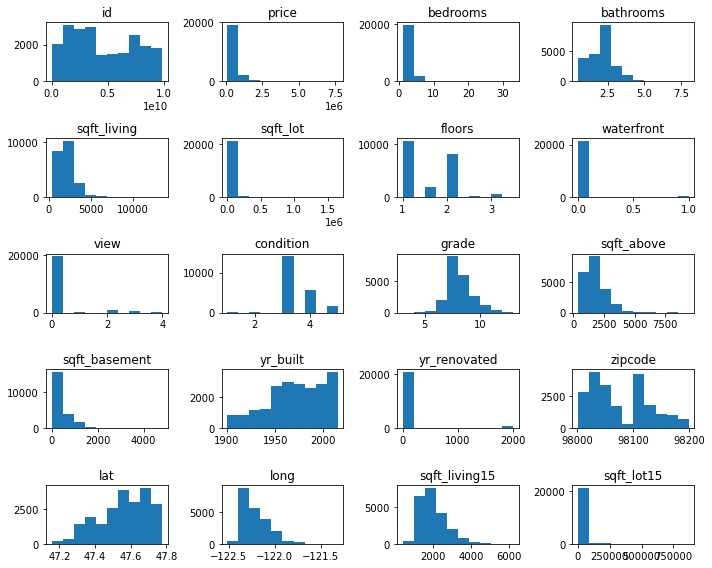

In [77]:
data.hist(grid=False,figsize=(10,8))
plt.tight_layout()

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

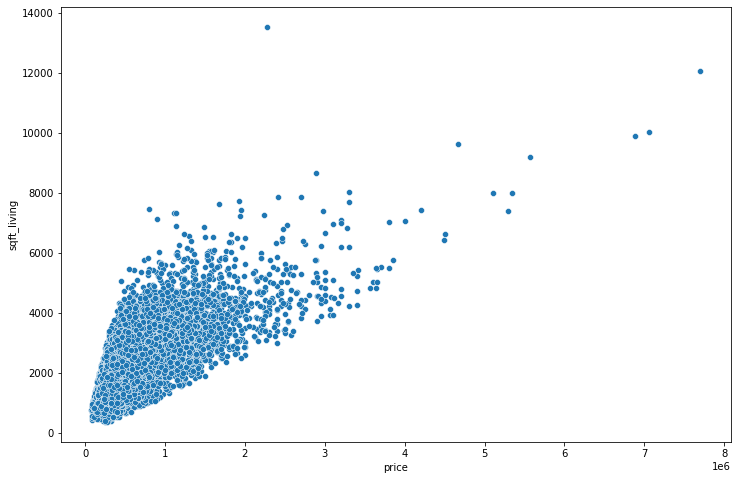

In [78]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='sqft_living',data=data)

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

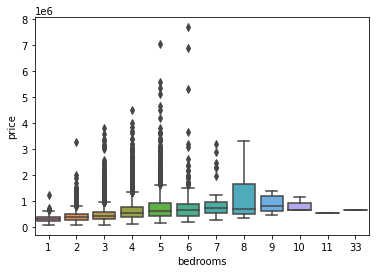

In [79]:
sns.boxplot(x='bedrooms',y='price',data=data)

<AxesSubplot:xlabel='price', ylabel='lat'>

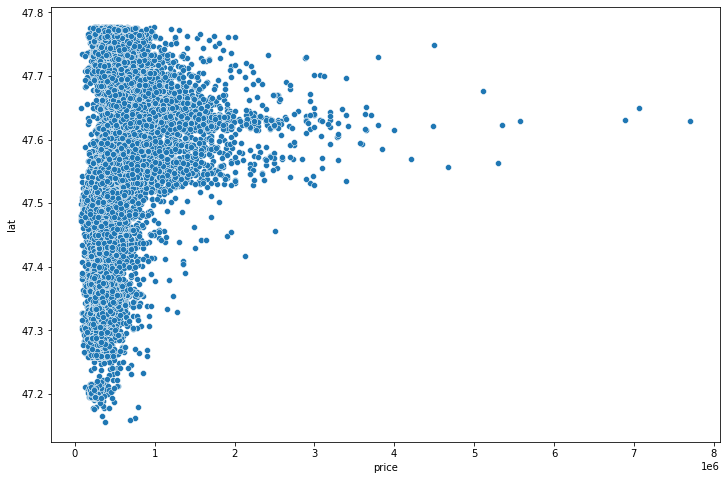

In [80]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='lat',data=data)

<AxesSubplot:xlabel='price', ylabel='long'>

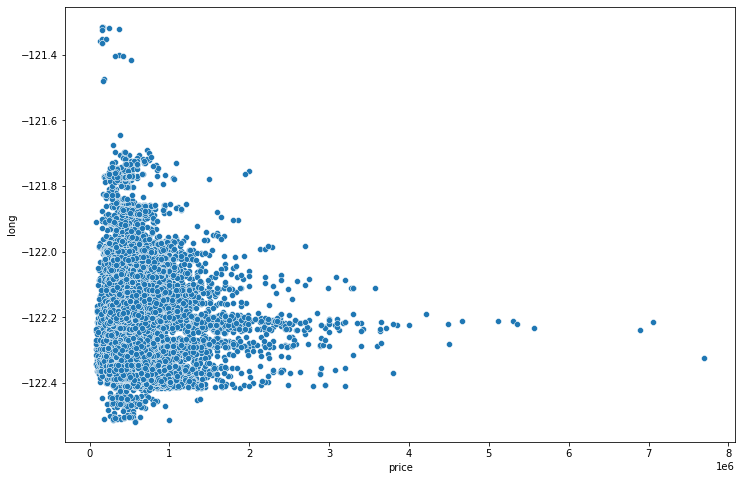

In [81]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='long',data=data)

In [82]:
data.drop(columns="id", inplace=True)

<AxesSubplot:xlabel='price', ylabel='long'>

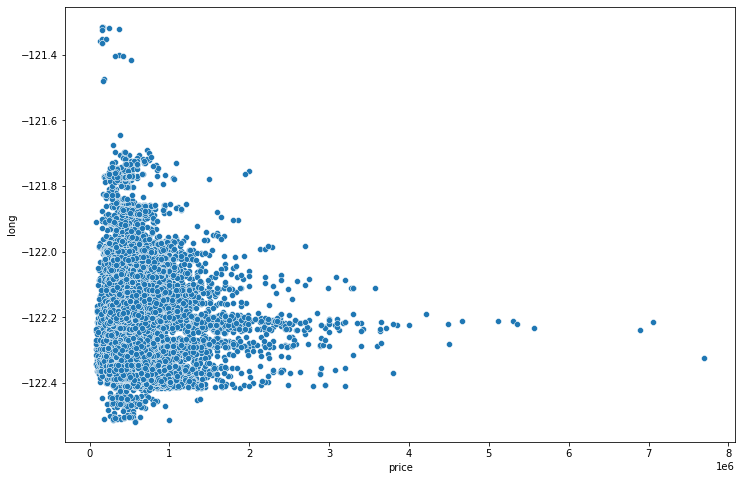

In [83]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='price',y='long',data=data)

In [84]:
#Creating year and month from date column
data['date'] = pd.to_datetime(data['date'])
data['month'] = data['date'].apply(lambda date:date.month)
data['year'] = data['date'].apply(lambda date:date.year)

<AxesSubplot:xlabel='month'>

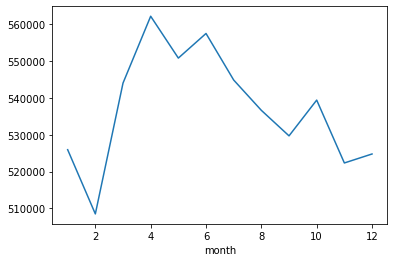

In [85]:
data.groupby('month').mean()["price"].plot()

<AxesSubplot:xlabel='year'>

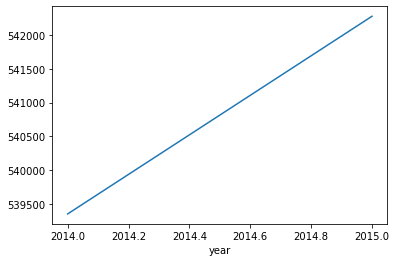

In [86]:
data.groupby('year').mean()["price"].plot()

In [87]:
data.drop(labels="date", axis=1, inplace=True)
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'month', 'year'],
      dtype='object')

In [88]:
data.zipcode.value_counts()

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

In [89]:
data.drop(labels="zipcode", axis=1, inplace=True)
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'month', 'year'],
      dtype='object')

<AxesSubplot:xlabel='yr_built', ylabel='price'>

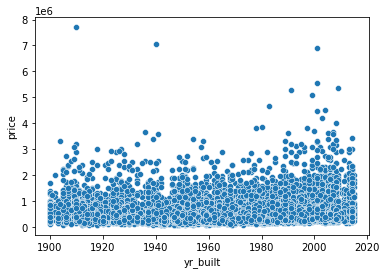

In [90]:
sns.scatterplot(x="yr_built", y="price", data=data)

<AxesSubplot:>

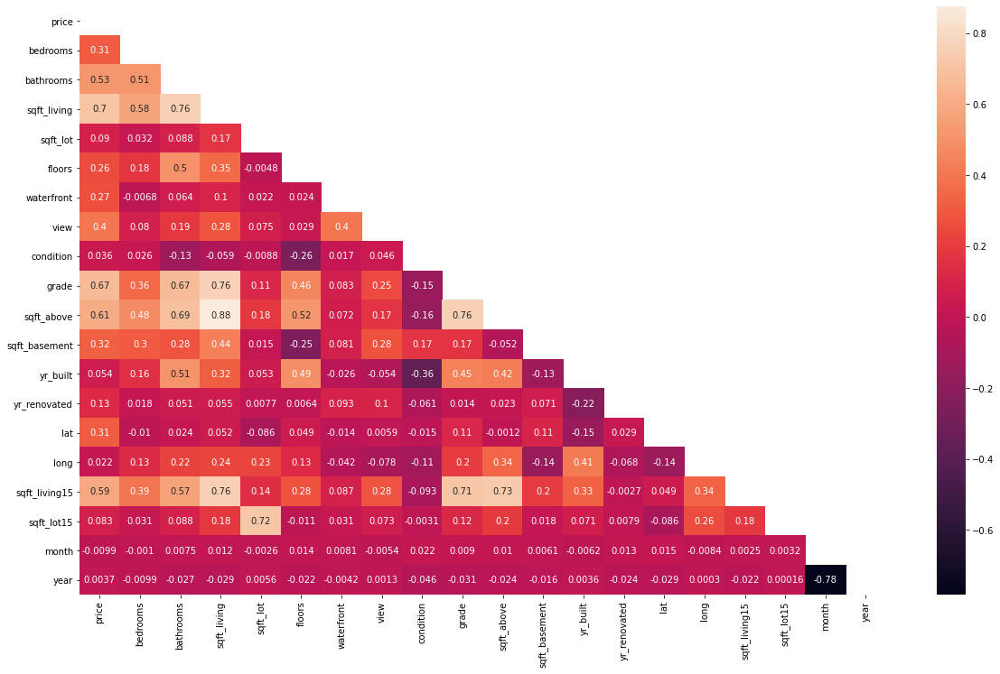

In [91]:
mat= data.corr()
plt.figure(figsize=(20,12))
sns.heatmap(mat, annot=True, mask=np.triu(mat),)

In [93]:
from sklearn.model_selection import train_test_split
x= data.drop("price", axis=1)
y= data["price"]
x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.3, random_state=42)

In [94]:
from sklearn.preprocessing import MinMaxScaler as scaler

scale= scaler()

x_train= scale.fit_transform(x_train)
x_test= scale.transform(x_test)

In [96]:
# Creating model-1

model1= keras.Sequential([
    keras.layers.Dense(4, activation="relu"),
    keras.layers.Dense(1)
])

model1.compile(optimizer= keras.optimizers.SGD(), loss=keras.losses.mse, metrics=["mse"])

model1_history= model1.fit(x_train, y_train, epochs=50, validation_split=0.2)

Epoch 1/50
378/378 [==============================] - 1s 3ms/step - loss: 449933836288.0000 - mse: 449933836288.0000 - val_loss: 120820441088.0000 - val_mse: 120820441088.0000
Epoch 2/50
378/378 [==============================] - 1s 2ms/step - loss: 139738349568.0000 - mse: 139738349568.0000 - val_loss: 120983068672.0000 - val_mse: 120983068672.0000
Epoch 3/50
378/378 [==============================] - 1s 2ms/step - loss: 139820793856.0000 - mse: 139820793856.0000 - val_loss: 120805097472.0000 - val_mse: 120805097472.0000
Epoch 4/50
378/378 [==============================] - 1s 2ms/step - loss: 139811192832.0000 - mse: 139811192832.0000 - val_loss: 120805253120.0000 - val_mse: 120805253120.0000
Epoch 5/50
378/378 [==============================] - 1s 2ms/step - loss: 139787042816.0000 - mse: 139787042816.0000 - val_loss: 120909447168.0000 - val_mse: 120909447168.0000
Epoch 6/50
378/378 [==============================] - 2s 5ms/step - loss: 139798396928.0000 - mse: 139798396928.0000 - v

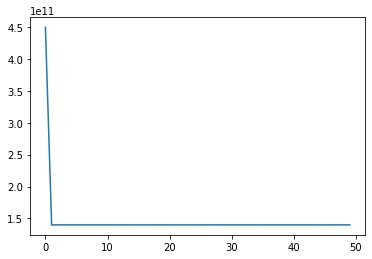

In [99]:
plt.plot(model1_history.history["loss"])

In [116]:
from sklearn.metrics import mean_squared_error, r2_score

preds= model1.predict(x_test)
model1.evaluate(x_test,y_test)

203/203 [==============================] - 0s 1ms/step - loss: 132703453184.0000 - mse: 132703453184.0000


[132703453184.0, 132703453184.0]

In [117]:
mean_squared_error(y_test, preds), r2_score(y_test, preds) 

(132703496710.5319, -0.0007920965508183553)

In [107]:
# Creating model-2

model2= keras.Sequential([
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(32, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(32, activation="relu"),
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(1)
])

model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), loss=keras.losses.mse, metrics=["mse"])

model2_history= model2.fit(x_train, y_train, epochs=100, validation_split=0.2)

Epoch 1/100
378/378 [==============================] - 1s 3ms/step - loss: 105057386496.0000 - mse: 105057386496.0000 - val_loss: 39859466240.0000 - val_mse: 39859466240.0000
Epoch 2/100
378/378 [==============================] - 1s 2ms/step - loss: 37884825600.0000 - mse: 37884825600.0000 - val_loss: 38212734976.0000 - val_mse: 38212734976.0000
Epoch 3/100
378/378 [==============================] - 1s 2ms/step - loss: 35380064256.0000 - mse: 35380064256.0000 - val_loss: 38635966464.0000 - val_mse: 38635966464.0000
Epoch 4/100
378/378 [==============================] - 1s 2ms/step - loss: 34438029312.0000 - mse: 34438029312.0000 - val_loss: 43465207808.0000 - val_mse: 43465207808.0000
Epoch 5/100
378/378 [==============================] - 1s 2ms/step - loss: 32632324096.0000 - mse: 32632324096.0000 - val_loss: 33803122688.0000 - val_mse: 33803122688.0000
Epoch 6/100
378/378 [==============================] - 1s 2ms/step - loss: 32345081856.0000 - mse: 32345081856.0000 - val_loss: 33344

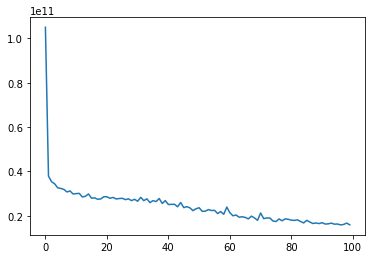

In [110]:
plt.plot(model2_history.history["loss"])

In [118]:
preds= model2.predict(x_test)
# model1.evaluate(x_test,y_test)

mean_squared_error(y_test, preds), r2_score(y_test, preds) 

(19949981633.250587, 0.849545909189998)

In [122]:
# Creating model-3

tf.random.set_seed(42)

model3= keras.Sequential([
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(1)
])

model3.compile(optimizer=keras.optimizers.Adam(), loss=keras.losses.mse, metrics=["mse"])

model3_history= model3.fit(x_train, y_train, epochs=100, validation_split=0.23)

Epoch 1/100
364/364 [==============================] - 1s 2ms/step - loss: 281166774272.0000 - mse: 281166774272.0000 - val_loss: 83360866304.0000 - val_mse: 83360866304.0000
Epoch 2/100
364/364 [==============================] - 1s 2ms/step - loss: 93214736384.0000 - mse: 93214736384.0000 - val_loss: 72280416256.0000 - val_mse: 72280416256.0000
Epoch 3/100
364/364 [==============================] - 1s 2ms/step - loss: 77353459712.0000 - mse: 77353459712.0000 - val_loss: 57408147456.0000 - val_mse: 57408147456.0000
Epoch 4/100
364/364 [==============================] - 1s 2ms/step - loss: 60706533376.0000 - mse: 60706533376.0000 - val_loss: 46968598528.0000 - val_mse: 46968598528.0000
Epoch 5/100
364/364 [==============================] - 1s 2ms/step - loss: 51485171712.0000 - mse: 51485171712.0000 - val_loss: 44005416960.0000 - val_mse: 44005416960.0000
Epoch 6/100
364/364 [==============================] - 1s 2ms/step - loss: 46946488320.0000 - mse: 46946488320.0000 - val_loss: 41420

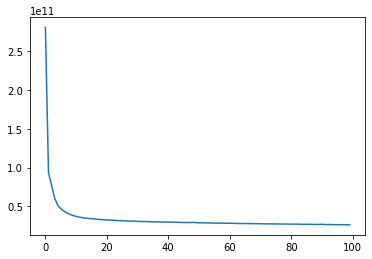

In [123]:
plt.plot(model3_history.history["loss"])

In [124]:
preds= model3.predict(x_test)
# model1.evaluate(x_test,y_test)

mean_squared_error(y_test, preds), r2_score(y_test, preds) 

(30361827601.914093, 0.7710242920944632)

In [133]:
# Creating model-4

tf.random.set_seed(42)

model4= keras.Sequential([
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dense(16, activation="relu"),
    keras.layers.Dense(1)
])

model4.compile(optimizer=keras.optimizers.Adam(), loss=keras.losses.mse, metrics=["mse"])

model4_history= model4.fit(x_train, y_train, epochs=250, validation_split=0.25)

oss: 18569940992.0000 - val_mse: 18569940992.0000
Epoch 137/250
355/355 [==============================] - 1s 2ms/step - loss: 15879823360.0000 - mse: 15879823360.0000 - val_loss: 18672613376.0000 - val_mse: 18672613376.0000
Epoch 138/250
355/355 [==============================] - 1s 2ms/step - loss: 15800039424.0000 - mse: 15800039424.0000 - val_loss: 18492569600.0000 - val_mse: 18492569600.0000
Epoch 139/250
355/355 [==============================] - 1s 2ms/step - loss: 15485625344.0000 - mse: 15485625344.0000 - val_loss: 18695622656.0000 - val_mse: 18695622656.0000
Epoch 140/250
355/355 [==============================] - 1s 2ms/step - loss: 15566622720.0000 - mse: 15566622720.0000 - val_loss: 18347196416.0000 - val_mse: 18347196416.0000
Epoch 141/250
355/355 [==============================] - 1s 2ms/step - loss: 15380622336.0000 - mse: 15380622336.0000 - val_loss: 17967314944.0000 - val_mse: 17967314944.0000
Epoch 142/250
355/355 [==============================] - 1s 2ms/step - loss

In [134]:
preds= model4.predict(x_test)
# model1.evaluate(x_test,y_test)

mean_squared_error(y_test, preds), r2_score(y_test, preds) 

(17883516538.989243, 0.8651302908031372)

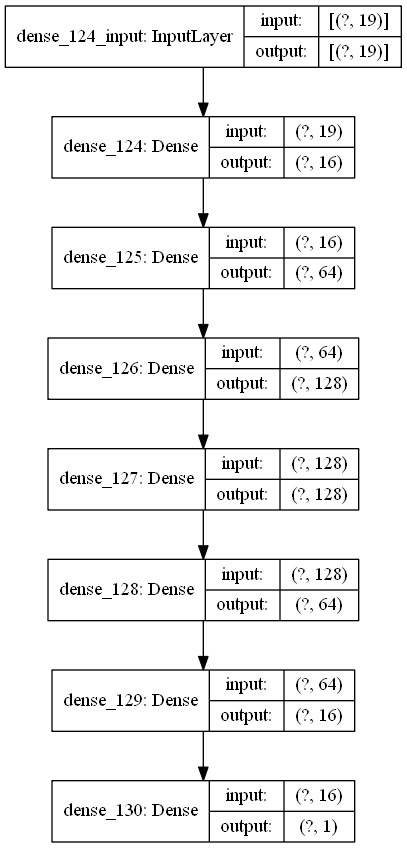

In [138]:
# wE will select the model-4 
from tensorflow.keras.utils import plot_model

plot_model(model4, show_shapes=True)


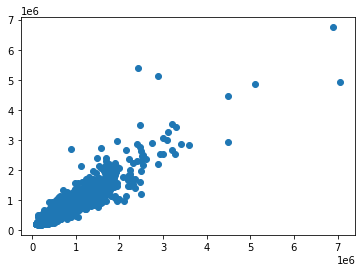

In [139]:
plt.scatter(y_test,preds)

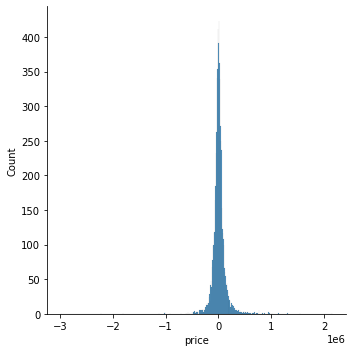

In [141]:
sns.displot(y_test- tf.squeeze(preds))